In [2]:
import os, xarray as xr, numpy as np, pandas as pd, dask, random, netCDF4
import cartopy.crs as ccrs, matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

from datetime import datetime as dt, timedelta
import datetime, time

import importlib
import matplotlib.patches as mpatches
import gc
from matplotlib.gridspec import GridSpec
dask.config.set({"array.slicing.split_large_chunks": False})
import sys
sys.path.insert(1, '/home/data/lab_hardik/udf/')


import h5netcdf

ERROR 1: PROJ: proj_create_from_database: Open of /home/lab_hardik/my_conda/share/proj failed


In [3]:
import random

In [4]:
import composite_funcs
import grad_funcs
importlib.reload(composite_funcs)
from composite_funcs import *
from grad_funcs import *

[30. 60. 90.]
[10. 30. 50.]
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$", '${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$'])
["$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$"]
["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$"]
['${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$']
["$u'$$\\mathcal{S}̅_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$"]
[30. 60. 90.]
[10. 30. 50.]


In [5]:
# tst = xr.open_dataset('/home/data/lab_hardik/data/ERA5/climatology/t_3D/dly_clmtlgy_stdPlevs_prmnsn_temperature_1980_2022_wFeb.nc')
# tst.close()

importlib.reload(composite_funcs)
from composite_funcs import *

[30. 60. 90.]
[10. 30. 50.]


In [6]:
dir_csv = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'
# files = [s for s in os.listdir(dir_csv) if 'Apr' in s]
# # files.sort(key = os.path.getctime)
# files

In [7]:
os.chdir(dir_csv)

In [8]:
import variables
from variables import *

In [9]:
dir_plots = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/'

In [10]:
def plot_samples(ds, save_str = ''):
#     global fig, ax
    # num_plots = 10 if df.shape[0]>=10 else df.shape[0]
    # num_plots = 10 if len(ds.date)>=10 else len(ds.date)

    # num_plots = int(np.ceil(len(ds.date)/2)*2)

    num_plots = len(ds.date)

    nrow = int(np.ceil(num_plots/2))

    fig, ax = plt.subplots(
        nrow,2, figsize=(16, nrow*4), sharey=True, subplot_kw={'projection': ccrs.PlateCarree()}
    )

    for i in range(num_plots):
        r = bicol_panel_rownum(i)
        c = bicol_panel_colnum(i)
        print('rowunm',r)
        print('colnum',c)

        dt_str = str(ds.date.dt.date[i].data)

        tot_flx = df.loc[df['date'] == dt_str, 'Net_Adv'].values[0].round()
        dse_anom_Lag1 = df.loc[df['date'] == dt_str, 'dse_anom_Lag1'].values[0].round()

        da_plt = ds[dse_var].isel(date = i)#.mean(['date'])#.compute()
        da_cont = ds[z_var].isel(date = i)#.mean(['date'])#.compute()
        da_u = (ds[u_var]).isel(date = i)#.mean(['date'])#.compute()
        da_v = (ds[v_var]).isel(date = i)#.mean(['date'])#.compute()
        # da_u = ds['adv_flx_x'].mean(['date']).compute()
        # da_v = ds['adv_flx_y'].mean(['date']).compute()

        print('calling inner_composite() on i = ', i)
        # vmin = np.nan; vmax=np.nan
        inner_plot_composite(
            da_plt = da_plt, da_cont = da_cont, da_u = da_u, da_v = da_v, xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom',scale_quiv= 70, 
            i = r, j = c, ax=ax[r,c], 
            title_str = 'dse_anom_Lag1 = {}, dse_flx = {}, date = {}'\
            .format(dse_anom_Lag1, tot_flx, dt_str)
            )
    plt.tight_layout()
    
    if save_str != '':
        plt.savefig(dir_plots + save_str)
        plt.close()
        

In [11]:
dat_dir = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

mar_csvs = [
    
    'Mar_posbg_amplif_nlsat_xNL_v2.csv', 
    'Mar_posbg_amplif_nlsat_yNL_v2.csv',
    
    'Mar_posbg_amplif_ql_xy_v2.csv',
    'Mar_posbg_amplif_nl_yNL_v2.csv', 

    'Mar_posbg_decay_ql_xy_v2.csv', 
    'Mar_posbg_decay_nl_yNL_v2.csv', 'Mar_posbg_decay_nl_xNL_v2.csv',
    'Mar_posbg2_decay_ql_xy_v2.csv', 'Mar_posbg2_decay_nl_xNL_v2.csv',
    
    'Mar_negbg_amplif_ql_xy_v2.csv', 'Mar_negbg2_amplif_ql_xy_v2.csv', 
    'Mar_negbg_decay_ql_xy_v2.csv', 'Mar_negbg2_decay_ql_xy_v2.csv', 'Mar_negbg2_decay_nl_zNL_v2.csv'
]

files = [s for s in mar_csvs if 'posbg' in s]

files.sort(key = lambda s: (s.split('_')[1], s.split('_')[2], s.split('_')[3], s.split('_')[4]))
print(len(files))
files

9


['Mar_posbg_amplif_nl_yNL_v2.csv',
 'Mar_posbg_amplif_nlsat_xNL_v2.csv',
 'Mar_posbg_amplif_nlsat_yNL_v2.csv',
 'Mar_posbg_amplif_ql_xy_v2.csv',
 'Mar_posbg_decay_nl_xNL_v2.csv',
 'Mar_posbg_decay_nl_yNL_v2.csv',
 'Mar_posbg_decay_ql_xy_v2.csv',
 'Mar_posbg2_decay_nl_xNL_v2.csv',
 'Mar_posbg2_decay_ql_xy_v2.csv']

## New plotting section

In [12]:
dir_data = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [40]:
i=3
df = pd.read_csv(dir_csv + files[i], parse_dates=['date'])
print(df.shape)
print(files[i])
df.columns

(14, 27)
Mar_posbg_amplif_ql_xy_v2.csv


Index(['date', '$u'$$\mathcal{S}^'_x$', '$v'$$\mathcal{S}^'_y$',
       '$w'$$\mathcal{S}^'_z$', '$v'$$\mathcal{S}̅_y$', '$w'$$\mathcal{S}̅_z$',
       '${u̅}$$\mathcal{S}^'_x$', 'T_main', 'NL_sum', 'x_contrib_NL',
       'y_contrib_NL', 'z_contrib_NL', 'Net_Adv', '$\mathcal{S}^'_y$',
       'dse_anom', 'dse_anom_Lag1', '$u'$', '$v'$', '$w'$',
       '$\mathcal{S}^'_x$', '$\mathcal{S}^'_z$', '${u̅}$', '${v̅}$', '${w̅}$',
       '$\mathcal{S}̅_x$', '$\mathcal{S}̅_y$', '$\mathcal{S}̅_z$'],
      dtype='object')

In [14]:
dir_data

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [15]:
importlib.reload(grad_funcs)
from grad_funcs import *

importlib.reload(composite_funcs)
from composite_funcs import *


[30. 60. 90.]
[10. 30. 50.]


In [16]:
dir_plots

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/'

In [17]:
dat_dir

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

In [18]:
dir_data

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [19]:
os.getcwd()

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files'

In [20]:
dir_csv

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

In [21]:
files[0]

'Mar_posbg_amplif_nl_yNL_v2.csv'

In [22]:
files[0].replace('.csv','_') + pd.read_csv(files[0]).date[0].replace('-', '_') + '_2Dave.nc'

'Mar_posbg_amplif_nl_yNL_v2_2007_03_26_2Dave.nc'

In [23]:
tst= xr.open_dataset(dir_data + files[0].replace('.csv','_') + pd.read_csv(files[0]).date[0].replace('-', '_') + '_2Dave.nc')
tst

/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.


<xarray.Dataset>
Dimensions:        (latitude: 201, longitude: 481)
Coordinates:
  * latitude       (latitude) float64 10.0 10.25 10.5 10.75 ... 59.5 59.75 60.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 119.5 119.8 120.0
    date           datetime64[ns] ...
Data variables:
    u              (latitude, longitude) float64 ...
    v              (latitude, longitude) float64 ...
    u_anom_10D     (latitude, longitude) float64 ...
    v_anom_10D     (latitude, longitude) float64 ...
    z_anom_10D     (latitude, longitude) float64 ...
    dse_anom       (latitude, longitude) float64 ...
    dse_anom_Lag1  (latitude, longitude) float64 ...

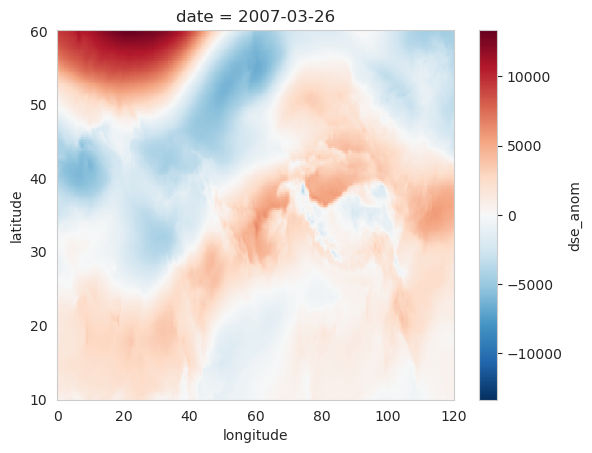

In [24]:
tst.dse_anom.plot()

In [25]:
tst.close()

In [26]:
for file in files:
    print(file)
    print("out of", pd.read_csv(dat_dir + file, parse_dates=['date']).shape[0], "nc files,")
    existing_nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')
    ]
    print(len(existing_nc_lst), 'files exist')


Mar_posbg_amplif_nl_yNL_v2.csv
out of 8 nc files,
8 files exist
Mar_posbg_amplif_nlsat_xNL_v2.csv
out of 9 nc files,
9 files exist
Mar_posbg_amplif_nlsat_yNL_v2.csv
out of 7 nc files,
7 files exist
Mar_posbg_amplif_ql_xy_v2.csv
out of 14 nc files,
14 files exist
Mar_posbg_decay_nl_xNL_v2.csv
out of 5 nc files,
5 files exist
Mar_posbg_decay_nl_yNL_v2.csv
out of 6 nc files,
6 files exist
Mar_posbg_decay_ql_xy_v2.csv
out of 6 nc files,
6 files exist
Mar_posbg2_decay_nl_xNL_v2.csv
out of 11 nc files,
11 files exist
Mar_posbg2_decay_ql_xy_v2.csv
out of 7 nc files,
7 files exist


In [27]:
file = files[1]
print(file)

Mar_posbg_amplif_nlsat_xNL_v2.csv


In [28]:
df = pd.read_csv(dir_csv + file, parse_dates=['date'])
print(df.shape)
two_day_averaging = True

if two_day_averaging == True:
    nc_lst = [s for s in os.listdir(dir_data) if 
              starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
             and s.endswith('_2Dave.nc')]
else:
    nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

print('len(nc_lst)', len(nc_lst))

if 'Net_Adv' not in df.columns:
    df['Net_Adv'] = df['adv_recon_2Dave'].copy()

os.chdir(dir_data)
def preprocess(ds):
    return ds.expand_dims('date')

ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
print('ds_brnch', ds_brnch.dims)

flux_dts = df.date.to_list()
print(len(flux_dts))


(9, 27)
len(nc_lst) 9
ds_brnch Frozen({'date': 9, 'latitude': 201, 'longitude': 481})
9


In [29]:
ds_brnch.dse_anom_Lag1.isel(date=0).compute()

<xarray.DataArray 'dse_anom_Lag1' (latitude: 201, longitude: 481)>
array([[ -333.54932731,  -341.28524135,  -289.5843032 , ...,
         -588.04984515,  -598.2988692 ,  -589.58548362],
       [ -335.12651604,  -353.31134411,  -302.83465391, ...,
         -602.52117781,  -626.88398994,  -613.12610872],
       [ -319.85750391,  -322.27512366,  -276.26637043, ...,
         -591.723209  ,  -647.2795311 ,  -622.29319737],
       ...,
       [-1732.35516222, -1727.56007357, -1721.7853474 , ...,
         -401.37412311,  -371.50977638,  -342.94158899],
       [-1612.78371189, -1609.36804551, -1605.57269106, ...,
         -588.32895323,  -579.5966966 ,  -567.90537936],
       [-1500.15682222, -1499.17727602, -1497.01530127, ...,
         -810.59065172,  -818.5719593 ,  -813.99316241]])
Coordinates:
  * latitude   (latitude) float64 10.0 10.25 10.5 10.75 ... 59.5 59.75 60.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 119.2 119.5 119.8 120.0
    date       datetime64[ns] 2000-03-27

0 Mar_posbg_amplif_nl_yNL_v2.csv
(8, 64)
len(nc_lst) 8
ds_brnch Frozen({'date': 8, 'latitude': 201, 'longitude': 481})
8
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-3934.06847352)
Coordinates:
    quantile  float64 0.0
vmax =  <xarray.DataArray 'dse_anom' ()>
array(9161.39838162)
Coordinates:
    quantile  float64 1.0
num_levs =  21
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-3934.06847352)
Coordinates:
    quantile  float64 0.0
vmax =  <xarray.DataArray 'dse_anom' ()>
array(9161.39838162)
Coordinates:
    quantile  float64 1.0
num_levs =  21
rowunm 0
colnum 0
calling inner_composite() on i =  0
[########################################] | 100% Completed | 102.03 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4249.92545358)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5386.62167436)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.92 ms
[#######################################

[########################################] | 100% Completed | 101.62 ms
[########################################] | 100% Completed | 101.81 ms
u_min =  -11.18803874503304 u_max = 15.304256186037097
v_min =  -9.061379973310075 v_max = 11.53545199719661
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 102.00 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-2489.50960195)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6163.32505756)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.55 ms
[########################################] | 100% Completed | 102.01 ms
u_min =  -12.012380345851074 u_max = 11.422368015654046
v_min =  -18.30273158331744 v_max = 11.639512938048762
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 102.65 ms
vmin 

[########################################] | 100% Completed | 101.57 ms
[########################################] | 100% Completed | 102.48 ms
u_min =  -7.8381396346369065 u_max = 16.977571097620917
v_min =  -7.888466962129172 v_max = 10.487682598482234
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 101.96 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7162.10718098)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6826.00122523)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.60 ms
[########################################] | 100% Completed | 102.36 ms
u_min =  -14.337585573550879 u_max = 16.142870415408396
v_min =  -15.977235576678577 v_max = 11.30536216073385
num_levs =  21
rowunm 3
colnum 0
calling inner_composite() on i =  6
[########################################] | 100% Completed | 102.55 ms
vmi

[########################################] | 100% Completed | 101.59 ms
[########################################] | 100% Completed | 101.40 ms
u_min =  -10.55226783754965 u_max = 17.014908459244126
v_min =  -14.305717038943706 v_max = 14.54346371957368
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 102.09 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-3780.39623118)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(4874.07918451)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.01 ms
[########################################] | 100% Completed | 102.50 ms
u_min =  -8.27979138046923 u_max = 20.454620507912523
v_min =  -6.265184638049169 v_max = 9.909525753274426
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 101.95 ms
vmin = 

[########################################] | 100% Completed | 102.12 ms
u_min =  -9.868214753421682 u_max = 16.0004651341639
v_min =  -18.37320217692626 v_max = 12.446266449137237
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 102.11 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-8181.79056412)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(9637.75006061)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.55 ms
[########################################] | 100% Completed | 101.62 ms
u_min =  -10.55226783754965 u_max = 17.014908459244126
v_min =  -14.305717038943706 v_max = 14.54346371957368
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 101.96 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-3780.39623118)
Coordinates:
   

[########################################] | 100% Completed | 101.52 ms
[########################################] | 100% Completed | 101.72 ms
u_min =  -15.016750666522281 u_max = 10.221174957911524
v_min =  -19.010247679480962 v_max = 11.681288192859107
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 101.88 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-8181.79056412)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(9637.75006061)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.37 ms
[########################################] | 100% Completed | 101.71 ms
u_min =  -12.28804667788548 u_max = 13.595917535344956
v_min =  -15.0084960177347 v_max = 12.982286077448531
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 102.13 ms
vmin

[########################################] | 100% Completed | 101.51 ms
[########################################] | 100% Completed | 101.92 ms
u_min =  -14.572238564133611 u_max = 14.925821754068059
v_min =  -17.674683677418372 v_max = 15.499177714564873
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 102.13 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6015.11716079)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(8188.5226138)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.57 ms
[########################################] | 100% Completed | 102.62 ms
u_min =  -13.398170705763855 u_max = 20.07071772470379
v_min =  -11.243411016527808 v_max = 11.502923281438655
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 102.07 ms
vmi

[########################################] | 100% Completed | 101.48 ms
[########################################] | 100% Completed | 102.31 ms
u_min =  -9.712748750090153 u_max = 16.057860686679014
v_min =  -10.578292270168083 v_max = 14.163291219094077
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 102.93 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7451.65899548)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6303.35792417)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.55 ms
[########################################] | 100% Completed | 101.84 ms
u_min =  -17.033081409640584 u_max = 12.290438029030668
v_min =  -14.319213445810654 v_max = 10.421039234672088
num_levs =  21
rowunm 0
colnum 0
calling inner_composite() on i =  0
[########################################] | 100% Completed | 102.18 ms
vm

[########################################] | 100% Completed | 101.68 ms
[########################################] | 100% Completed | 102.57 ms
u_min =  -8.46302863189374 u_max = 15.14726516109133
v_min =  -10.819078181446368 v_max = 10.795900491623254
num_levs =  21
rowunm 0
colnum 0
calling inner_composite() on i =  0
[########################################] | 100% Completed | 102.00 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6903.30853869)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(7679.64240271)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.15 ms
[########################################] | 100% Completed | 102.31 ms
u_min =  -12.467447143664575 u_max = 11.989232905206817
v_min =  -13.017563152696976 v_max = 15.77789051943109
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 102.40 ms
vmin 

[########################################] | 100% Completed | 101.73 ms
[########################################] | 100% Completed | 101.84 ms
u_min =  -9.25732296624465 u_max = 21.446555189436218
v_min =  -10.716081912133248 v_max = 8.744732319446838
num_levs =  21
rowunm 3
colnum 1
calling inner_composite() on i =  7
[########################################] | 100% Completed | 102.88 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-3746.5156807)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5914.84631238)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.56 ms
[########################################] | 100% Completed | 101.41 ms
u_min =  -11.459452089478246 u_max = 19.1289059290864
v_min =  -12.613166654246081 v_max = 12.597729970608402
num_levs =  21
rowunm 4
colnum 0
calling inner_composite() on i =  8
[########################################] | 100% Completed | 102.43 ms
vmin = 

rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 101.95 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4680.82183101)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6471.05894576)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.62 ms
[########################################] | 100% Completed | 101.47 ms
u_min =  -13.212048568216376 u_max = 16.54261321897319
v_min =  -13.917631618320426 v_max = 15.550553530824494
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 101.97 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7007.25224425)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6621.00585883)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.80

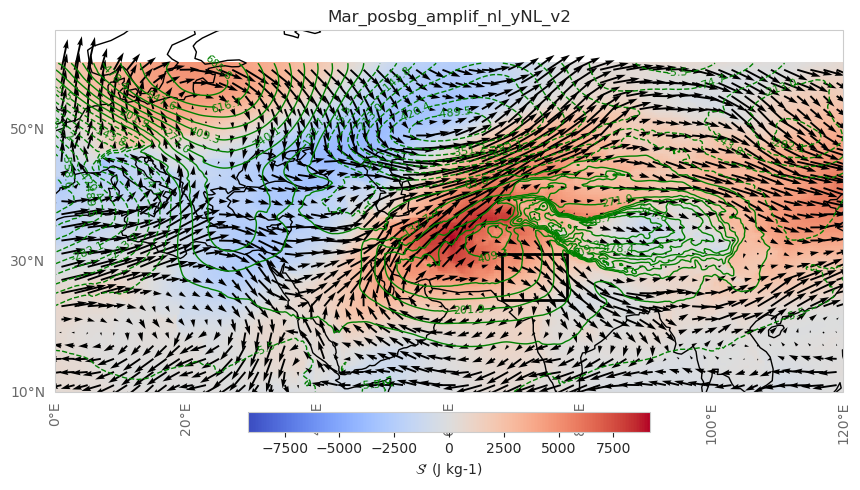

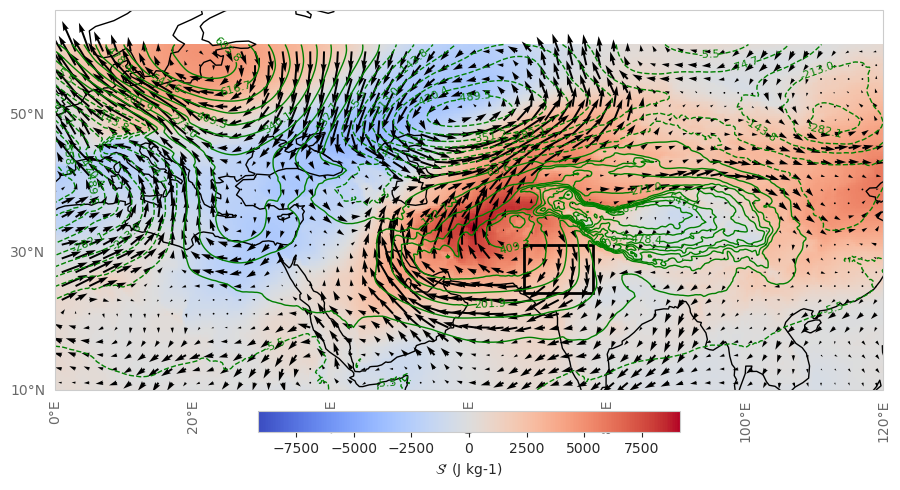

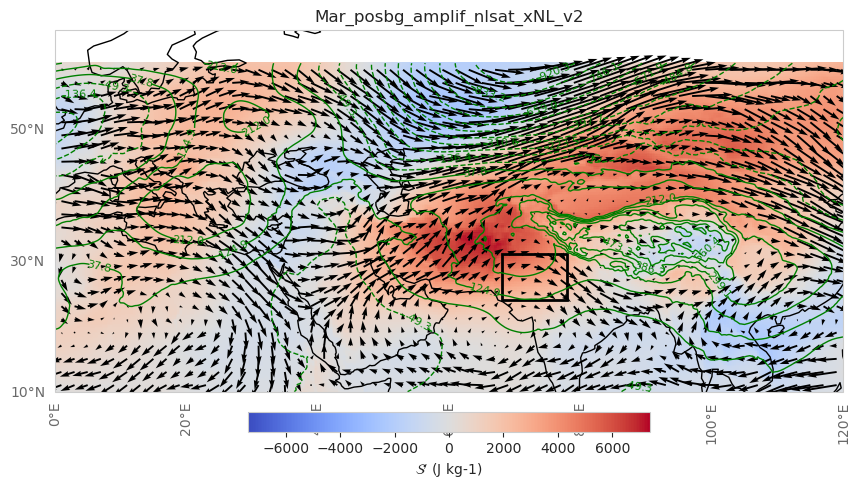

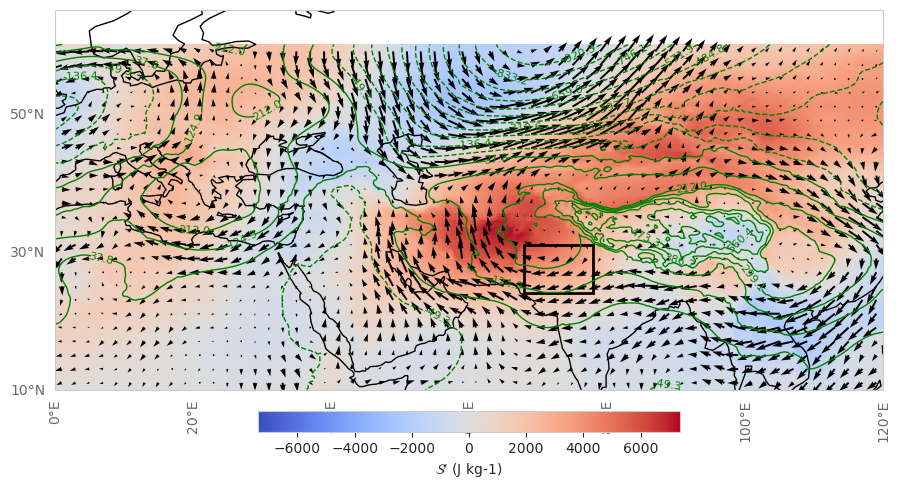

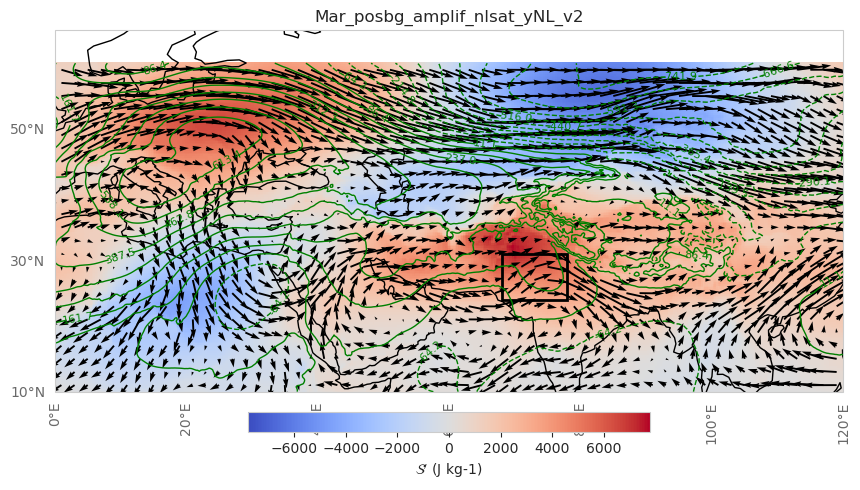

...

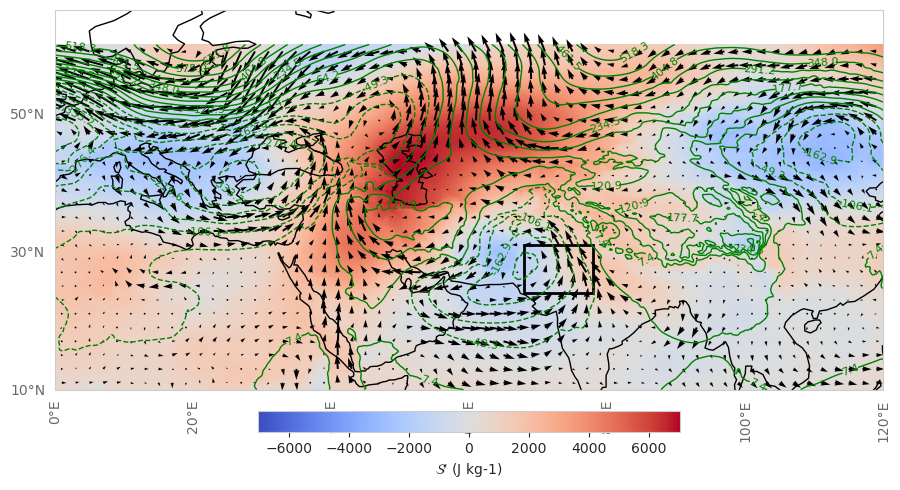

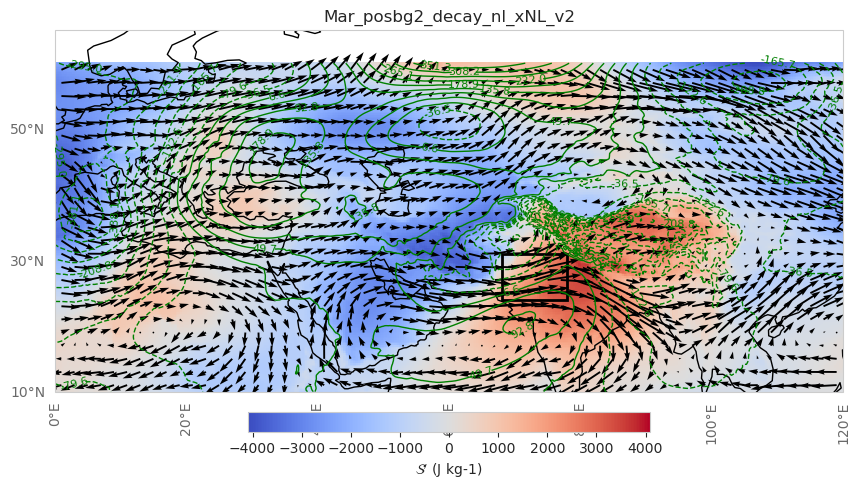

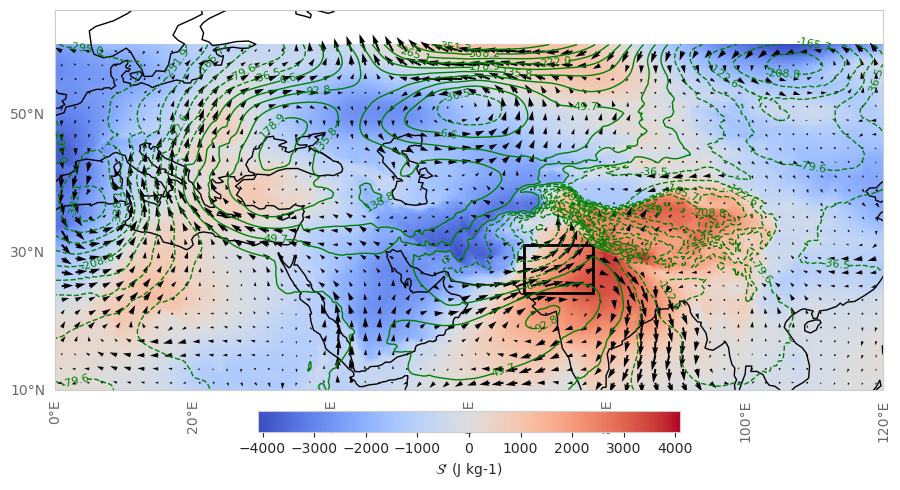

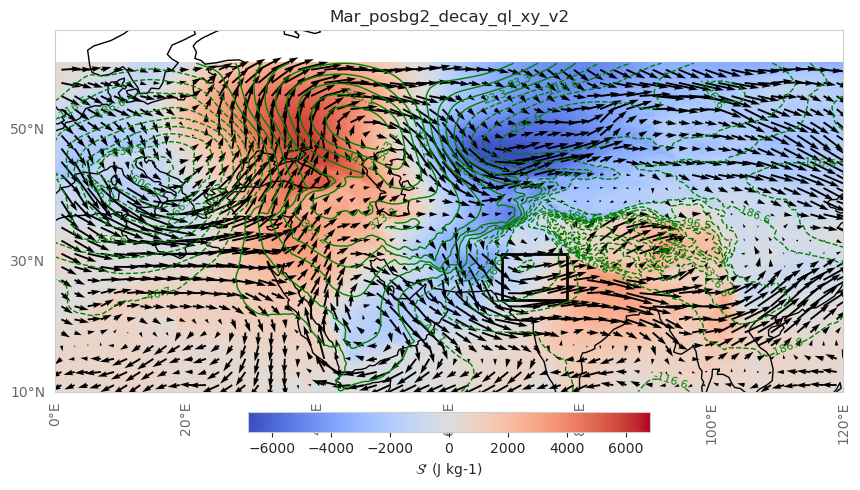

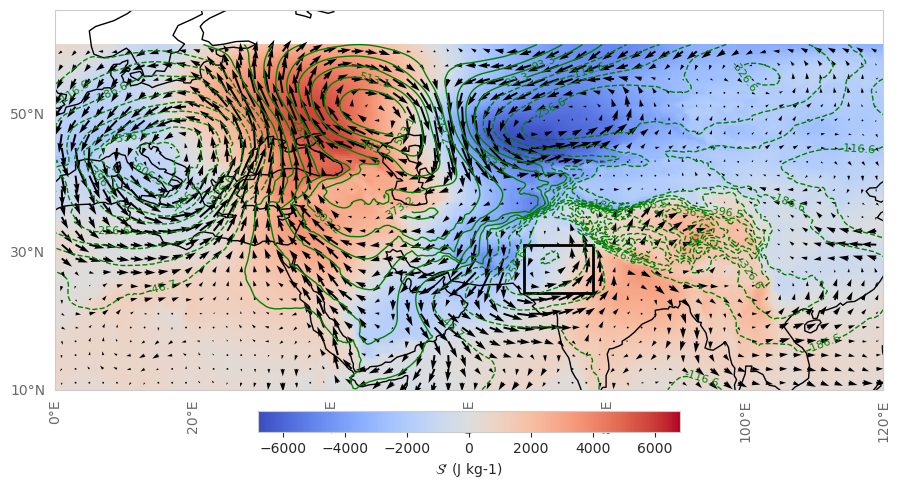

In [30]:
for i in range(len(files)):
    for two_day_averaging in [True]:
        file = files[i]
        print(i, file)

        # delete all pngs starting with the filename
        png_lst = [s for s in os.listdir(dir_plots) if s.startswith(file.replace('.csv', '')) and s.endswith('.png')]

        if len(png_lst) > 0:
            for png in png_lst:
                os.remove(dir_plots + png)
            
        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))

        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        save_str2 = file.replace('.csv', '_fullwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))
        save_str4 = file.replace('.csv', '_anomwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))

        u_var = 'u'; v_var = 'v'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite(
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8, 
            t_type = 'dse_anom', scale_quiv= 200, 
            title_str = file.replace('.csv',''), 
            save_str = save_str2 
        )

        gc.collect()
        gc.collect()

        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()


        plot_composite(        
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom', scale_quiv= 200, 
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))

            save_str = save_str4
        )
        gc.collect()
        gc.collect()


        ########################################
        ## each figure has 11 rows * 2 cols = 22 plots
        num_instances_22 = int(np.round((len(flux_dts)/22)))
        rmndr_plts = int(len(flux_dts)%22)
        tot_rnds = num_instances_22 + (1 if rmndr_plts>2 else 0)
        
        if tot_rnds==0:
            continue

        for n in range(1, tot_rnds+1):
            if (tot_rnds == 1) & (num_instances_22 == 0): # there are less than 22 instances and there is only the first round
                globals()[f'brnch_dates_{n}'] = flux_dts
            elif tot_rnds == num_instances_22: # each of the >=1 rounds has 22 instances
                globals()[f'brnch_dates_{n}'] = flux_dts[(n-1)*22:n*22]
            elif tot_rnds > num_instances_22: # last figure has < 22 plots
                if n <= num_instances_22: 
                    globals()[f'brnch_dates_{n}'] = flux_dts[(n-1)*22:n*22]
                if n > num_instances_22: 
                    globals()[f'brnch_dates_{n}'] = flux_dts[-1*rmndr_plts:]
                    
            save_str1 = file.replace('.csv', '_fullwnds_{}.png'.format(str(n) + ('_2Dave' if two_day_averaging==True else '')))
            save_str3 = file.replace('.csv', '_anomwnds_{}.png'.format(str(n) + ('_2Dave' if two_day_averaging==True else '')))

    #         brnch_dates = random.sample(flux_dts, 22 if df.shape[0] > 22 else df.shape[0])
    #         plot_samples(ds = ds_brnch, save_str = save_str1)

            ds = ds_brnch.sel(date=globals()[f'brnch_dates_{n}'])

            u_var = 'u'; v_var = 'v'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
            plot_samples(ds = ds, save_str = save_str1)
            gc.collect()
            gc.collect()

            u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        #     plot_samples(ds = ds_brnch.sel(date=brnch_dates), save_str = save_str3)
            plot_samples(ds = ds, save_str = save_str3)
            gc.collect()
            gc.collect()


## Save only composites with standardized colorbar, quivers; and formatted with font and sizes

In [31]:
params = {
    'legend.fontsize': 15,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': 'DejaVu Serif',
}

plt.rcParams.update(params)


[30. 60. 90.]
[10. 30. 50.]
0 Mar_posbg_amplif_nl_yNL_v2.csv
(8, 64)
len(nc_lst) 8
ds_brnch Frozen({'date': 8, 'latitude': 201, 'longitude': 481})
8
vmin =  -4000
vmax =  4000
1 Mar_posbg_amplif_nlsat_xNL_v2.csv
(9, 27)
len(nc_lst) 9
ds_brnch Frozen({'date': 9, 'latitude': 201, 'longitude': 481})
9
vmin =  -4000
vmax =  4000
2 Mar_posbg_amplif_nlsat_yNL_v2.csv
(7, 27)
len(nc_lst) 7
ds_brnch Frozen({'date': 7, 'latitude': 201, 'longitude': 481})
7
vmin =  -4000
vmax =  4000
3 Mar_posbg_amplif_ql_xy_v2.csv
(14, 27)
len(nc_lst) 14
ds_brnch Frozen({'date': 14, 'latitude': 201, 'longitude': 481})
14
vmin =  -4000
vmax =  4000
4 Mar_posbg_decay_nl_xNL_v2.csv
(5, 64)
len(nc_lst) 5
ds_brnch Frozen({'date': 5, 'latitude': 201, 'longitude': 481})
5
vmin =  -4000
vmax =  4000
5 Mar_posbg_decay_nl_yNL_v2.csv
(6, 64)
len(nc_lst) 6
ds_brnch Frozen({'date': 6, 'latitude': 201, 'longitude': 481})
6
vmin =  -4000
vmax =  4000
6 Mar_posbg_decay_ql_xy_v2.csv
(6, 27)
len(nc_lst) 6
ds_brnch Frozen({'date':

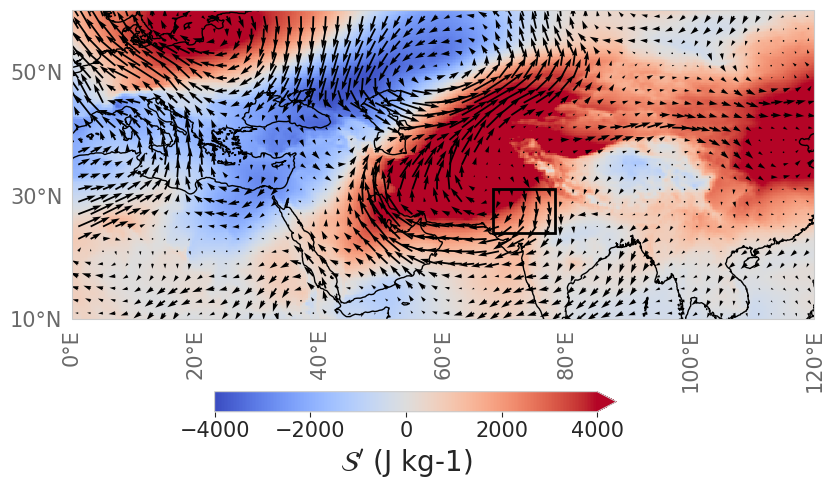

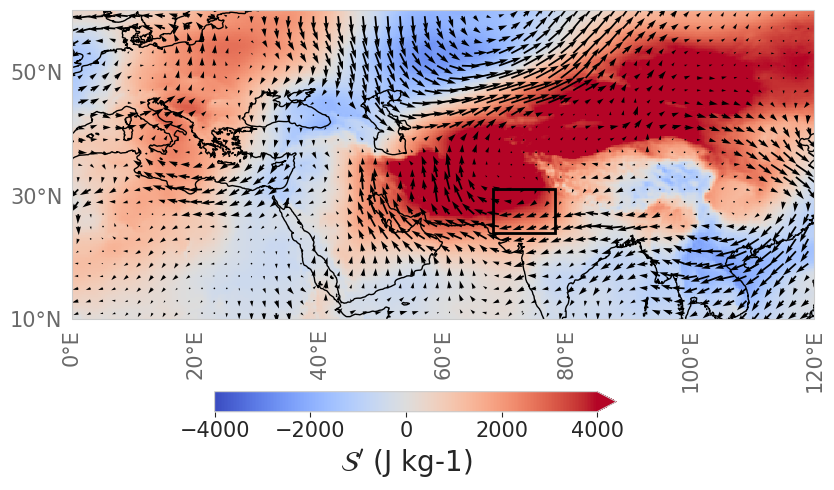

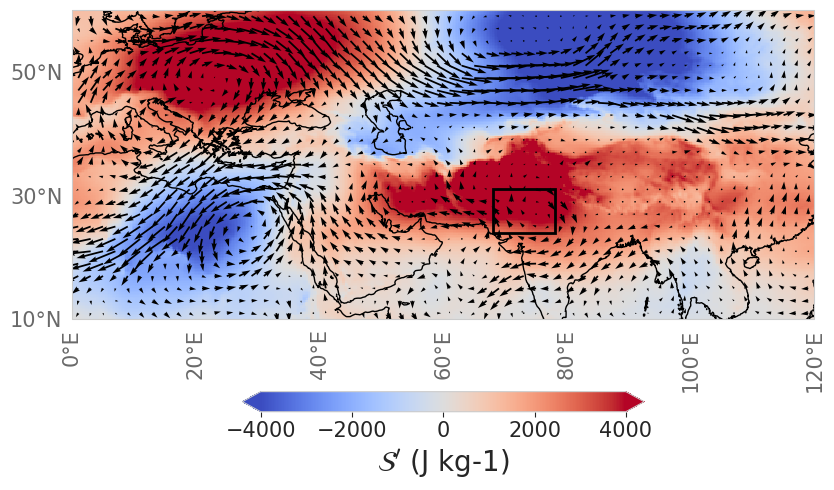

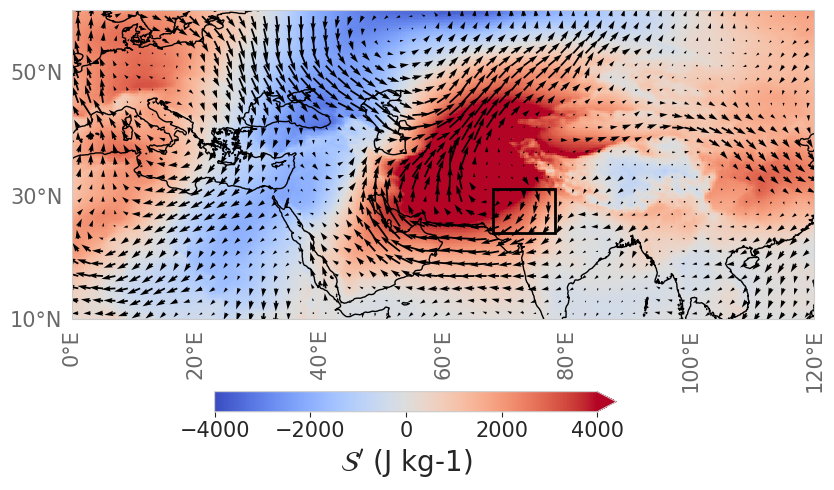

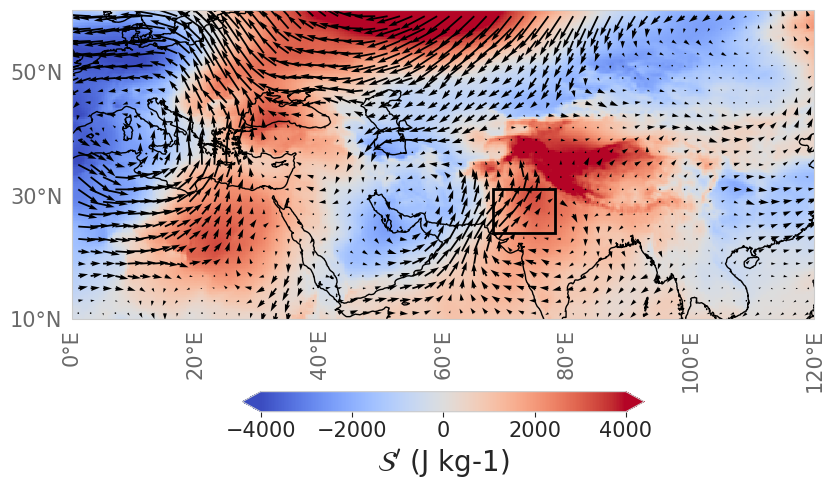

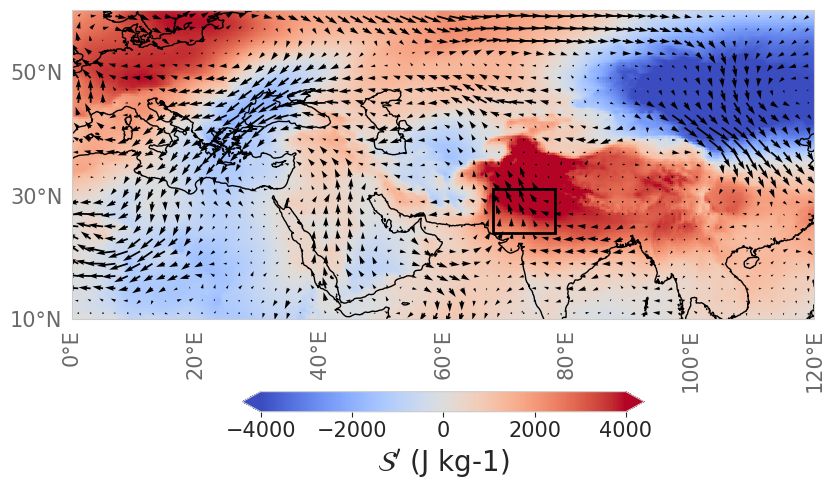

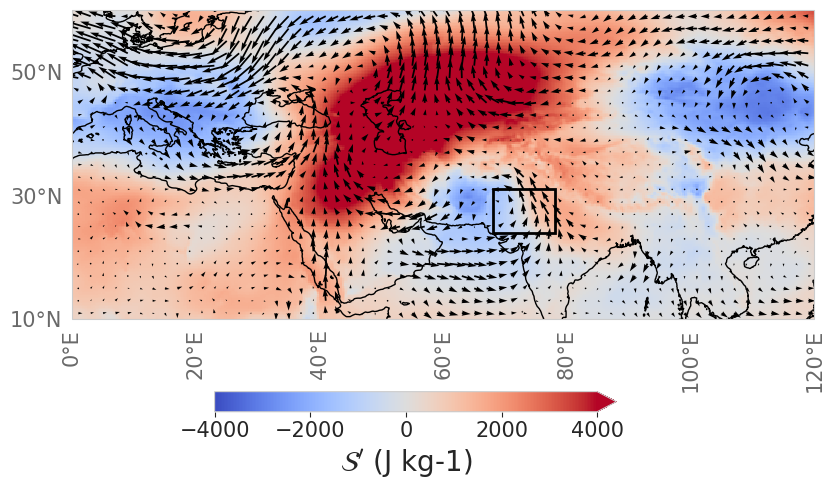

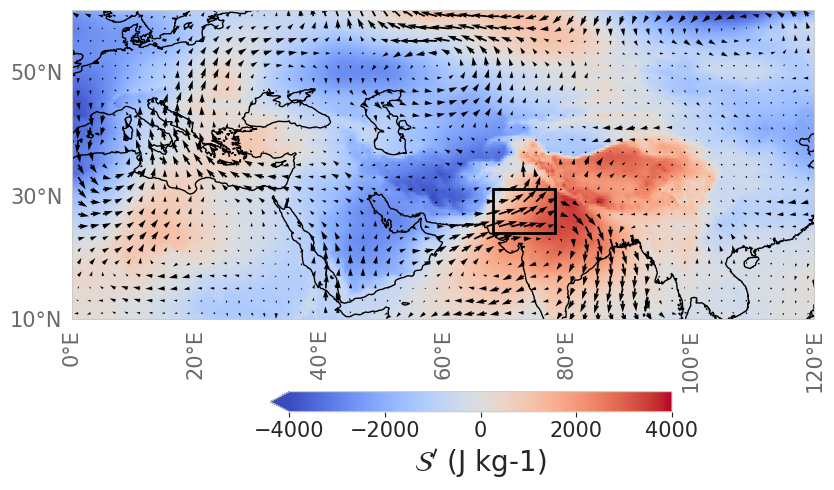

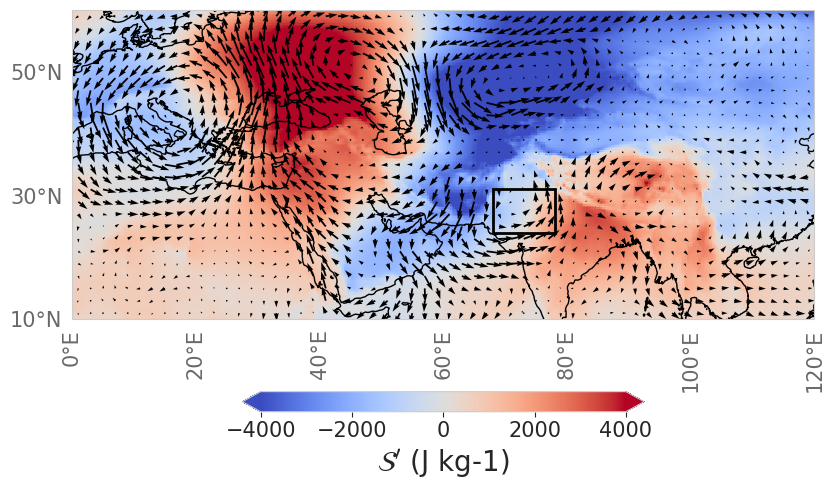

In [32]:
importlib.reload(composite_funcs)
from composite_funcs import *

for i in range(len(files)):
    for two_day_averaging in [True]:

        file = files[i]
        print(i, file)

        # delete all pngs starting with the filename
        png_lst = [s for s in os.listdir(dir_plots) if s.startswith(file.replace('.csv', '')) and s.endswith('.png')]

        if len(png_lst) > 0:
            for png in png_lst:
                os.remove(dir_plots + png)
            
        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        save_str4 = file.replace('.csv', '_anomwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))

        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite(        
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            contours='off', 
            cbar_pad=0.18,
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom', scale_quiv= 200, 
            latlon_ticksz=10, 
            latlon_tickcol = 'dimgray',
            dir_out = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/plots_final/',
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
            save_str = save_str4
        )
        gc.collect()
        gc.collect()


In [33]:
len(files)

9

In [34]:
files.sort(key = lambda s: ( s.split('_')[2], s.split('_')[3]))
files

['Mar_posbg_amplif_nl_yNL_v2.csv',
 'Mar_posbg_amplif_nlsat_xNL_v2.csv',
 'Mar_posbg_amplif_nlsat_yNL_v2.csv',
 'Mar_posbg_amplif_ql_xy_v2.csv',
 'Mar_posbg_decay_nl_xNL_v2.csv',
 'Mar_posbg_decay_nl_yNL_v2.csv',
 'Mar_posbg2_decay_nl_xNL_v2.csv',
 'Mar_posbg_decay_ql_xy_v2.csv',
 'Mar_posbg2_decay_ql_xy_v2.csv']

In [72]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

importlib.reload(composite_funcs)
from composite_funcs import *

0 Mar_posbg_amplif_nl_yNL_v2.csv
(8, 64)
len(nc_lst) 8
ds_brnch Frozen({'date': 8, 'latitude': 201, 'longitude': 481})
8
vmin =  -4000
vmax =  4000
1 Mar_posbg_amplif_nlsat_xNL_v2.csv
(9, 27)
len(nc_lst) 9
ds_brnch Frozen({'date': 9, 'latitude': 201, 'longitude': 481})
9
vmin =  -4000
vmax =  4000
2 Mar_posbg_amplif_nlsat_yNL_v2.csv
(7, 27)
len(nc_lst) 7
ds_brnch Frozen({'date': 7, 'latitude': 201, 'longitude': 481})
7
vmin =  -4000
vmax =  4000
3 Mar_posbg_amplif_ql_xy_v2.csv
(14, 27)
len(nc_lst) 14
ds_brnch Frozen({'date': 14, 'latitude': 201, 'longitude': 481})
14
vmin =  -4000
vmax =  4000
4 Mar_posbg2_decay_nl_xNL_v2.csv
(11, 64)
len(nc_lst) 11
ds_brnch Frozen({'date': 11, 'latitude': 201, 'longitude': 481})
11
vmin =  -4000
vmax =  4000
5 Mar_posbg2_decay_ql_xy_v2.csv
(7, 27)
len(nc_lst) 7
ds_brnch Frozen({'date': 7, 'latitude': 201, 'longitude': 481})
7
vmin =  -4000
vmax =  4000


/tmp/ipykernel_3676393/3941424133.py:228: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


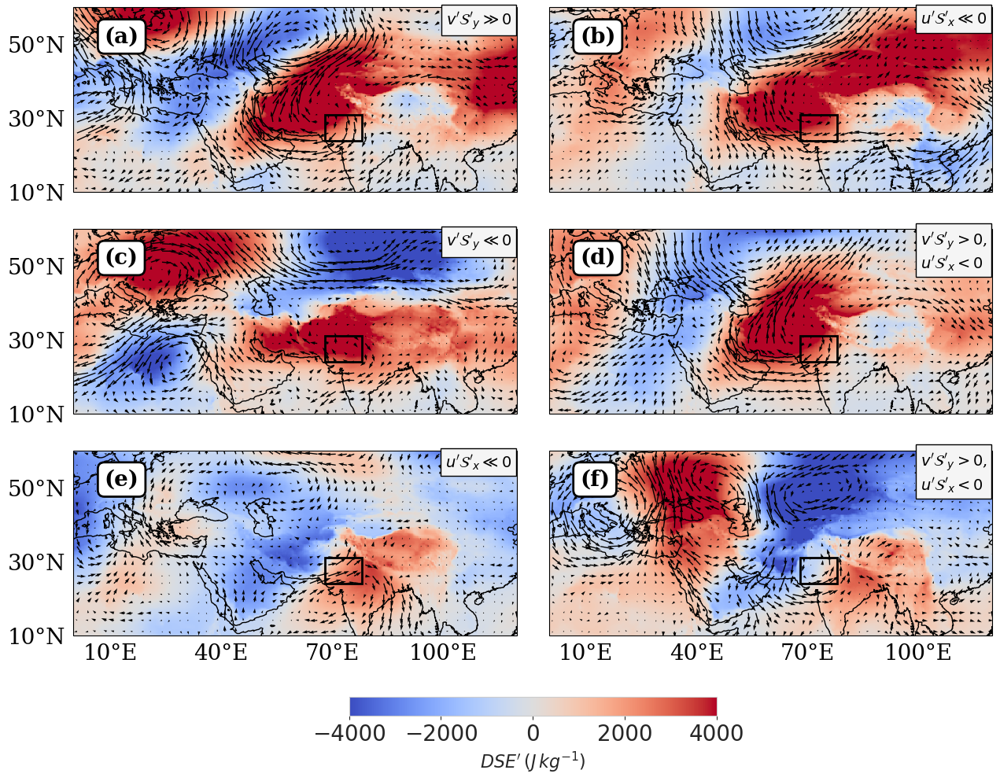

In [94]:
params = {
    'legend.fontsize': 15,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':20,
         'ytick.labelsize':20, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': 'DejaVu Serif',
}
plt.rcParams.update(params)

nrow = 3
ncol = 2

fig, ax = plt.subplots(
    nrows=nrow, ncols=ncol, 
    sharey=False, 
    subplot_kw={'projection': ccrs.PlateCarree()}, 
    figsize=(16,4*nrow),
    gridspec_kw={'hspace': 0.1}
)

importlib.reload(composite_funcs)
from composite_funcs import *

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)
border_thickness = 5

files_final = [s for s in files if s not in ['Mar_posbg_decay_nl_xNL_v2.csv', 
'Mar_posbg_decay_nl_yNL_v2.csv',
'Mar_posbg_decay_ql_xy_v2.csv']]
k=0
# for i in [i for i in range(7) if i not in [4,5]]:
for i in range(len(files_final)):
    for two_day_averaging in [True]:
        file = files_final[i]
        print(i, file)
        
        rowind = bicol_panel_rownum(k)
        colind = bicol_panel_colnum(k)

        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite_final_plot(
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            axi = ax[rowind, colind],
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            
            cbar_on = False, #if rowind + 1 < nrow else True,
            cbar_pad= 0.1 if rowind + 1 < nrow else 0.3,
            t_type = 'dse_anom', 
            
            contours='off', 
            cont_divisions=20, 
            coarsen_pts=10,
            scale_quiv= 150, 
            
            xtickrot=0,
            ytickrot=0,
            num_xticks=4,
            num_yticks=3, 
            xtick_offset=10,

            latlon_ticksz=20, 
            latlon_tickcol = 'black',
#             title_str = file + ', ' + str(df.shape[0])
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
        )

        ax[rowind, colind].text(
            .07, .9, '({})'.format(chr(96+(k+1))), 
            transform=ax[rowind, colind].transAxes, 
            fontsize=20, fontname ='DejaVu Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold'
        )

        ax[rowind, colind].spines["top"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["right"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["bottom"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["left"].set_linewidth(border_thickness)
        # Customize border color
        for spine in ax[rowind, colind].spines.values():
            spine.set_color("black")

        k = k+1
        gc.collect()
        gc.collect()

# cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])
# cbar = fig.colorbar(ax[0, 0].get_images()[0], cax=cbar_ax)
# cbar.set_label('$\mathcal{S}\'$ (J kg$^{-1}$)')
for r in range(nrow):
    for c in range(ncol):
        for label in ax[r][c].get_xticklabels() + ax[r][c].get_yticklabels():
            label.set_fontname('DejaVu Serif')

fontname = "DejaVu Serif"
props = dict(boxstyle='square', facecolor='whitesmoke', alpha=1, edgecolor='black')
annot_size = 18
ann_coords = [1, 1]
comp_anns = [
    
    '$v\' \mathcal{S}\'_{y}\gg0$', 
    '$u\'\mathcal{S}\'_{x}\ll0$',
    '$v\' \mathcal{S}\'_{y}\ll0$', 
    '$v\'\mathcal{S}\'_{y}>0$,\n$u\'\mathcal{S}\'_{x}<0$', 
    '$u\'\mathcal{S}\'_{x}\ll0$',     
    '$v\'\mathcal{S}\'_{y}>0$,\n$u\'\mathcal{S}\'_{x}<0$',
]

arrow_tip_y = 0.35
arrow_tip_x = 0.65
k=0

bbox = ax[r][c].get_position()
ref_height = 0.24  # Use the larger axes height as reference
scaled_fontsize = int(annot_size * bbox.height / ref_height)

for r in range(3):
    for c in range(2):
        renderer = fig.canvas.get_renderer()
        text_obj = ax[r][c].annotate(
            text=comp_anns[k],
            xy=(arrow_tip_x, arrow_tip_y),
            xytext=(1.0, 1.0),
            textcoords='axes fraction',
            xycoords='axes fraction',
            fontsize=scaled_fontsize,
            fontname=fontname,
            verticalalignment='top',
            horizontalalignment='right',
            color='black',
            bbox=props,
        )
        pos = ax[r, c].get_position()
        # Shift upward and compress height
        ax[r, c].set_position([
            pos.x0 - 0.045 * (ncol + c - 2),
            pos.y0 + 0.03 * (nrow + r - 3),  # shift higher rows up more
            pos.width,
            pos.height               # compress height slightly
        ])

        # Get bounding box in display coordinates
        bbox_display = text_obj.get_window_extent(renderer=renderer)

        # Convert to axes fraction
        bbox_axes = ax[r][c].transAxes.inverted().transform_bbox(bbox_display)
        box_width = bbox_axes.width
        box_height = bbox_axes.height

#             # for rounded edges
#             if ((r != 0) and (c==0)):
#                 text_obj.set_position((1.0 - box_width + 0.0145, 1.0 - box_height - 0.012))
#             else:
#                 text_obj.set_position((1.0 - box_width + 0.0145, 1.0 - box_height - 0.02))

        # for sharp edges
        if (c==0) or ((c==1) and (r==0)):
            text_obj.set_position((1.0 - box_width - 0.0125, 1.0 - box_height - 0.012)) #  - 0.008
        else:
            text_obj.set_position((1.0 - box_width - 0.012, 1.0 - box_height- 0.006)) #

#         if (r==1) and (c==1):
#             text_obj.set_position((1.0 - box_width - 0.011, 1.0 - box_height- 0.075)) #

#         if (r==2) and (c==1):
#             text_obj.set_position((1.0 - box_width - 0.011, 1.0 - box_height- 0.045)) #

#             text_obj.set_position((1.0 - box_width-0.015, 1.0 - box_height-0.08)) #  - 0.008

        text_obj.set_ha('left')
        text_obj.set_va('bottom')

        if (r != (nrow-1)):
            ax[r,c].set_xticks([])                
        if (c != 0):
            ax[r,c].set_yticks([])
            
        k = k +1


# fig.delaxes(ax[-1, -1])  # Adjust index for the empty subplot
# plt.tight_layout()
# plt.subplots_adjust(hspace=0.2) 
norm = colors.Normalize(vmin=-4000, vmax=4000)
cmap = cm.get_cmap('coolwarm')
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array([])  # Required for colorbar to work


bbox_left = ax[2, 0].get_position()
bbox_right = ax[2, 1].get_position()

# Compute full horizontal span
left_edge = bbox_left.x0
right_edge = bbox_right.x0 + bbox_right.width
new_center = (left_edge + right_edge) / 2
new_total_width = right_edge - left_edge

# Define colorbar dimensions
new_width = new_total_width * 0.4  # narrower than full span
new_left = new_center - new_width / 2
new_bottom = bbox_left.y0 - 0.085
new_height = 0.02

# Create colorbar axis and draw colorbar
cbar_ax = fig.add_axes([new_left, new_bottom, new_width, new_height])

cbar = fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal')
cbar.set_label('$DSE\'\,(J\,kg^{-1})$', fontsize=16)

plt.savefig('/home/data/lab_hardik/Manuscript1/Fig_Mar_regimes_posbg_v2.pdf', bbox_inches=None)


In [64]:
for r in range(nrow):
    for c in range(ncol):
        bbox = ax[r][c].get_position()
        print(f"Axes[{r},{c}] width: {bbox.width:.2f}, height: {bbox.height:.2f}")

Axes[0,0] width: 0.35, height: 0.20
Axes[0,1] width: 0.35, height: 0.20
Axes[1,0] width: 0.35, height: 0.20
Axes[1,1] width: 0.35, height: 0.20
Axes[2,0] width: 0.35, height: 0.20
Axes[2,1] width: 0.35, height: 0.20


In [57]:
fig.get_dpi()

100.0

In [53]:
'Mar_posbg_decay_nl_xNL_v2.csv', 
'Mar_posbg_decay_nl_yNL_v2.csv',
'Mar_posbg_decay_ql_xy_v2.csv'

'Mar_posbg_decay_ql_xy_v2.csv'

In [52]:
1

1